In [194]:
import imblearn

In [1]:
import os
os.chdir('..')

In [3]:
from itertools import chain
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from tqdm.notebook import tqdm
from rdkit import Chem
from rdkit.Chem import AllChem, Descriptors
from sklearn.metrics import classification_report
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree, metrics
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

In [4]:
import shap
import xgboost
shap.initjs()

In [5]:
from espora import fragmenter

In [100]:
def get_mw(smi):
    mol = Chem.MolFromSmiles(smi)
    if mol:
        return Descriptors.MolWt(mol)
    return None

In [128]:
def run_fragrank_frag(smis, threhsold_mw=250):
    fragments = [fragmenter.frag_rec(smi, max_depth=2) for smi in tqdm(smis, desc="Fragmenting")]
    fragments = [list(filter(lambda x: get_mw(x) < threhsold_mw, fragment)) for fragment in fragments]
    
    unique_subs = set()
    for subs in chain.from_iterable(fragments):
        unique_subs.add(subs)

    G = nx.Graph()
    for sub in unique_subs:
        G.add_node(sub)

    for i in range(len(smis)):
        for j in range(len(fragments[i])):
            for k in range(j+1, len(fragments[i])):
                sub1 = fragments[i][j]
                sub2 = fragments[i][k]
                if G.has_edge(sub1, sub2):
                    G[sub1][sub2]['weight'] += 1
                else:
                    G.add_edge(sub1, sub2, weight=1)

    pr = nx.pagerank(G)
    return pr

In [129]:
def featurize(smis, top_fragments_mols):
    X_vec = []
    for smi in tqdm(smis, desc="Featurizing"):
        mol = Chem.MolFromSmiles(smi)
        X_vec.append(np.array([mol.HasSubstructMatch(i) for i in top_fragments_mols]).astype(int))
    return np.array(X_vec) 

In [221]:
def model(clf, X_train, X_test, y_train, y_test, top_fragments_mols):
    X_train = featurize(X_train, top_fragments_mols)
    X_test = featurize(X_test, top_fragments_mols)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print("recall_score: ", metrics.recall_score(y_test, y_pred))
    print("precision_score: ", metrics.precision_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    y_true = y[test_index]
    y_probas = clf.predict_proba(X_test)
    skplt.metrics.plot_roc(y_true, y_probas)
    plt.show()
    return (metrics.recall_score(y_test, y_pred), metrics.precision_score(y_test, y_pred))

In [222]:
df = pd.read_csv('./data/tox21/nr-ar.smiles', sep='\t', header=None)

In [223]:
df.columns = ['smis', 'id', 'tox']

In [224]:
df

,smis,id,tox
0,CC(O)=O.CCNC(=O)[C@@H]1CCCN1C(=O)[C@H](CCCNC(N...,NCGC00167516-01,0
1,Cl.CCCCCCOC1=CC=C(C(=N)N(CCCC)CCCC)C2=C1C=CC=C2,NCGC00181091-01,0
2,Cl.Cl.COCC(=O)O[C@]3(CCN(C)CCCC1=NC2=C(N1)C=CC...,NCGC00094089-01,0
3,Cl.Cl.CCCCC(CC)CNC(=N)NC(=N)NCCCCCCNC(=N)NC(=N...,NCGC00094996-01,0
4,[Br-].CCCCCCCCCCCC[N+](C)(C)CCOC1=CC=CC=C1,NCGC00257773-01,0
...,...,...,...
9357,CCCC1=CC(=O)NC(=S)N1,NCGC00259290-01,0
9358,S=C1NCCN1,NCGC00258846-01,0
9359,S=C1NCCN1,NCGC00254936-01,0
9360,CCOP(=S)(OCC)OC1=CC=C(C=C1)[N+]([O-])=O,NCGC00254571-01,0


In [225]:
df["mw"] = df.smis.apply(get_mw)

In [226]:
df = df[df["mw"] < 800].dropna()

<AxesSubplot:ylabel='Density'>

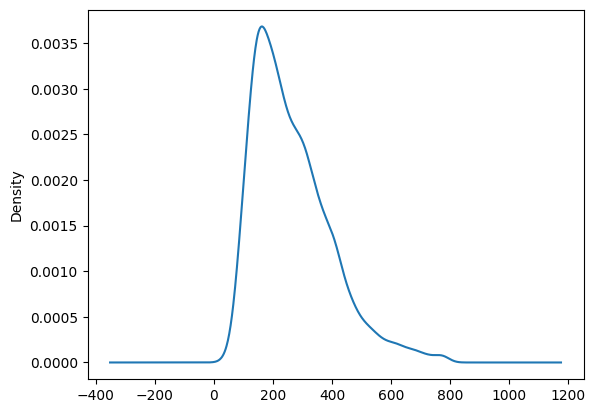

In [227]:
df.mw.plot.density()

In [228]:
X = df.smis.values
y = df.tox.values

In [229]:
sss = StratifiedShuffleSplit(n_splits=3, test_size=0.2, random_state=42)

In [230]:
sss.get_n_splits(X, y)

3

Fold 1/3: Top K: 2000


Fragmenting:   0%|          | 0/298 [00:00<?, ?it/s]

Featurizing:   0%|          | 0/7359 [00:00<?, ?it/s]

Featurizing:   0%|          | 0/1840 [00:00<?, ?it/s]

recall_score:  0.5405405405405406
precision_score:  0.3076923076923077
              precision    recall  f1-score   support

           0       0.98      0.95      0.96      1766
           1       0.31      0.54      0.39        74

    accuracy                           0.93      1840
   macro avg       0.64      0.74      0.68      1840
weighted avg       0.95      0.93      0.94      1840



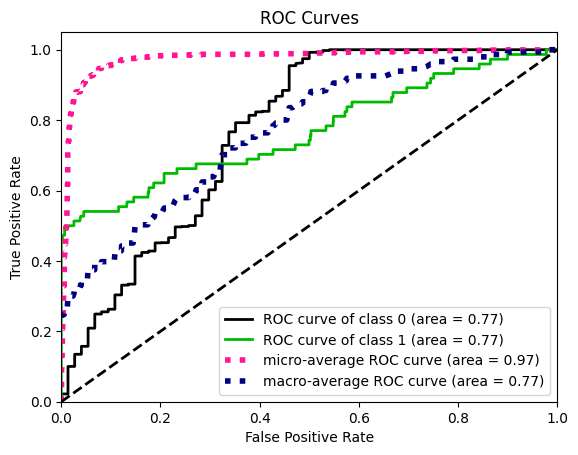

Fold 2/3: Top K: 2000


Fragmenting:   0%|          | 0/298 [00:00<?, ?it/s]

Featurizing:   0%|          | 0/7359 [00:00<?, ?it/s]

Featurizing:   0%|          | 0/1840 [00:00<?, ?it/s]

recall_score:  0.7162162162162162
precision_score:  0.3680555555555556
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1766
           1       0.37      0.72      0.49        74

    accuracy                           0.94      1840
   macro avg       0.68      0.83      0.73      1840
weighted avg       0.96      0.94      0.95      1840



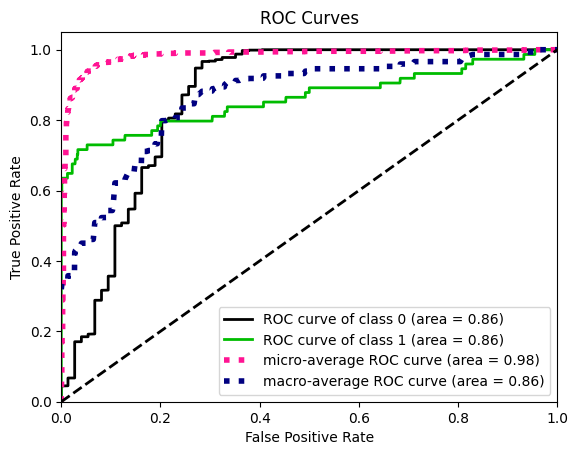

Fold 3/3: Top K: 2000


Fragmenting:   0%|          | 0/298 [00:00<?, ?it/s]

Featurizing:   0%|          | 0/7359 [00:00<?, ?it/s]

Featurizing:   0%|          | 0/1840 [00:00<?, ?it/s]

recall_score:  0.6486486486486487
precision_score:  0.3404255319148936
              precision    recall  f1-score   support

           0       0.98      0.95      0.97      1766
           1       0.34      0.65      0.45        74

    accuracy                           0.94      1840
   macro avg       0.66      0.80      0.71      1840
weighted avg       0.96      0.94      0.94      1840



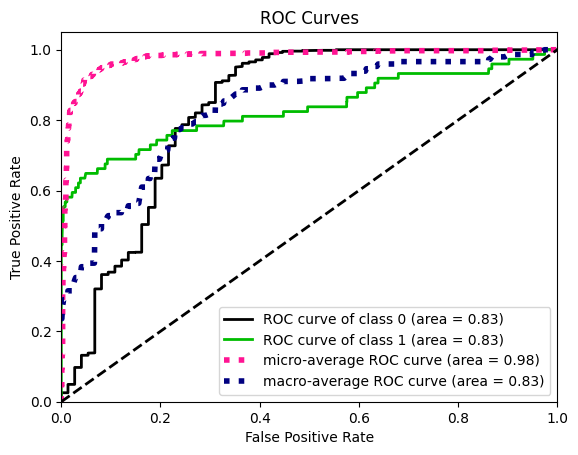

In [234]:
top_k = 2000
precs = []
recalls = []
for i, (train_index, test_index) in enumerate(sss.split(X, y)):
    print(f"Fold {i+1}/{sss.get_n_splits(X, y)}: Top K: {top_k}")
    clf = Pipeline(
    [
        ("smote", SMOTE(random_state=42)),
        ("xgb_clf", XGBClassifier(random_state=42)),
    ]
    )
    # clf = XGBClassifier()
    pr = run_fragrank_frag(X[train_index][y[train_index]==1])
    top_fragments = sorted(pr, key=pr.get, reverse=True)[:top_k]
    top_fragments_mols = [Chem.MolFromSmarts(i) for i in top_fragments]
    r,p = model(clf, X[train_index], X[test_index], y[train_index], y[test_index], top_fragments_mols)
    precs.append(p)        
    recalls.append(r)

In [235]:
Chem.Draw.MolsToGridImage([Chem.MolFromSmiles(i) for i in top_fragments], molsPerRow=5, useSVG=True, maxMols=top_k)

In [236]:
Xtest = featurize(X[test_index], top_fragments_mols)

Featurizing:   0%|          | 0/1840 [00:00<?, ?it/s]

In [246]:
this = featurize(X[test_index].tolist(), top_fragments_mols)

Featurizing:   0%|          | 0/1840 [00:00<?, ?it/s]

In [247]:
# create SHAP explainer
explainer = shap.Explainer(clf['xgb_clf'])
# generate SHAP values for test data
shap_values = explainer(this)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


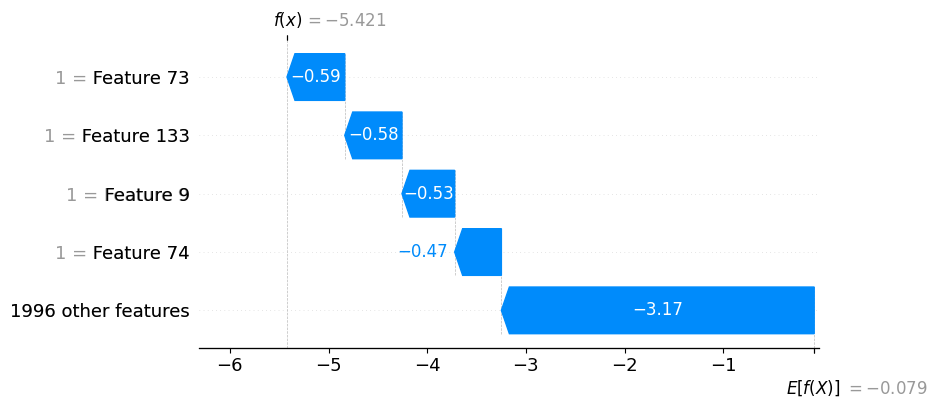

In [259]:
shap.waterfall_plot(shap_values[-1], max_display=5)

In [262]:
X[test_index][-1], y[test_index][-1]

('CCCCCCCCC1CCC(=O)O1', 1)

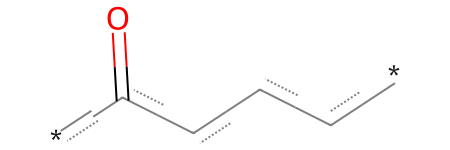

In [261]:
top_fragments_mols[73]

In [253]:
y[test_index][21]

0

In [256]:
ypred = clf['xgb_clf'].predict(this)

In [258]:
Xtest[ypred != y[test_index]]

array([[0, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [1, 0, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]])